# Problem 1 - Python Implemenation of Gaussian Elimination using Scaled Partial Pivoting (SPP)

In [ ]:
def scaled_partial_pivoting_gaussian_elimination(A, b):
    # Number of equations
    n = len(b)

    # Form the augmented matrix
    Aug = [[A[i][j] for j in range(n)] + [b[i]] for i in range(n)]

    # Scale factors
    scale = [max(abs(Aug[i][j]) for j in range(n)) for i in range(n)]

    # Forward elimination
    for k in range(n-1):
        # Pivot row selection
        max_index = k
        max_ratio = abs(Aug[k][k]) / scale[k]
        for i in range(k+1, n):
            ratio = abs(Aug[i][k]) / scale[i]
            if ratio > max_ratio:
                max_index = i
                max_ratio = ratio

        # Swap rows if necessary
        if k != max_index:
            Aug[k], Aug[max_index] = Aug[max_index], Aug[k]
            scale[k], scale[max_index] = scale[max_index], scale[k]

        # Eliminate entries below the pivot
        for i in range(k+1, n):
            factor = Aug[i][k] / Aug[k][k]
            for j in range(k, n+1):
                Aug[i][j] -= factor * Aug[k][j]

    # Back substitution
    x = [0] * n
    for i in range(n-1, -1, -1):
        x[i] = Aug[i][n]
        for j in range(i+1, n):
            x[i] -= Aug[i][j] * x[j]
        x[i] /= Aug[i][i]

    return x

# Example usage

A = [
    [0.4096, 0.1234, 0.3678, 0.2943],
    [0.2246, 0.3872, 0.4015, 0.1129],
    [0.3645, 0.1920, 0.3781, 0.0643],
    [0.1784, 0.4002, 0.2786, 0.3927]
    ]

b = [0.4043, 0.1550, 0.4240, 0.2557]

solution = scaled_partial_pivoting_gaussian_elimination(A, b)
print("The solution vector x is:")
print()
print(solution)

The solution vector x is:

[3.4605863893500883, 1.560952885600231, -2.9342339757223943, -0.4300595137280602]


# Problem 2 - Solving Tridiagonal System by Hand

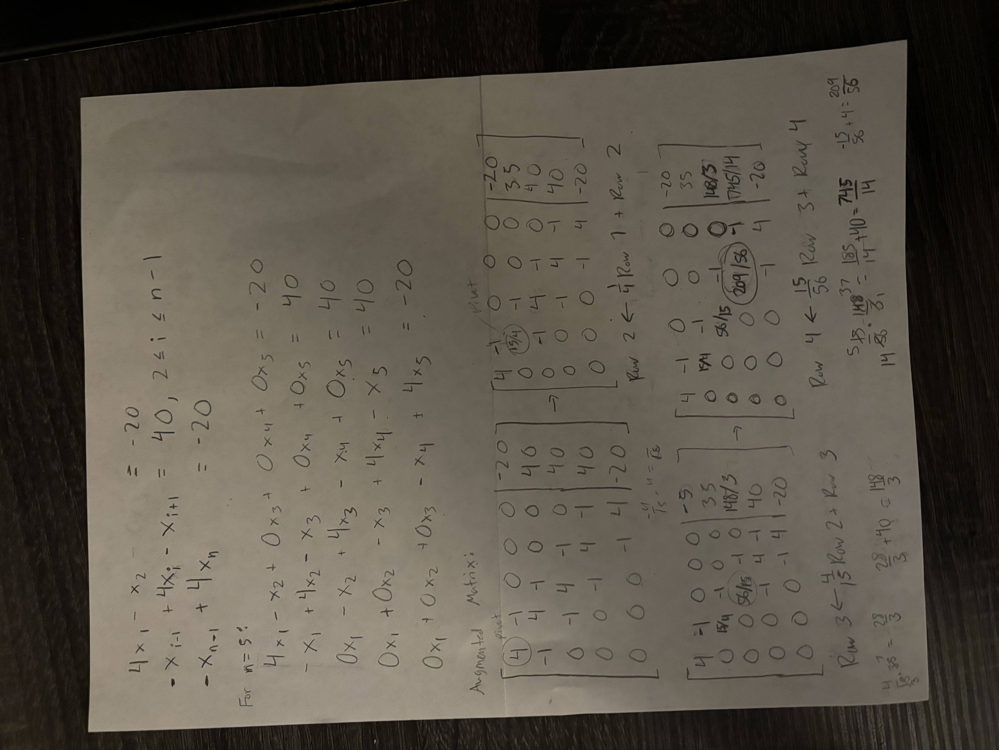

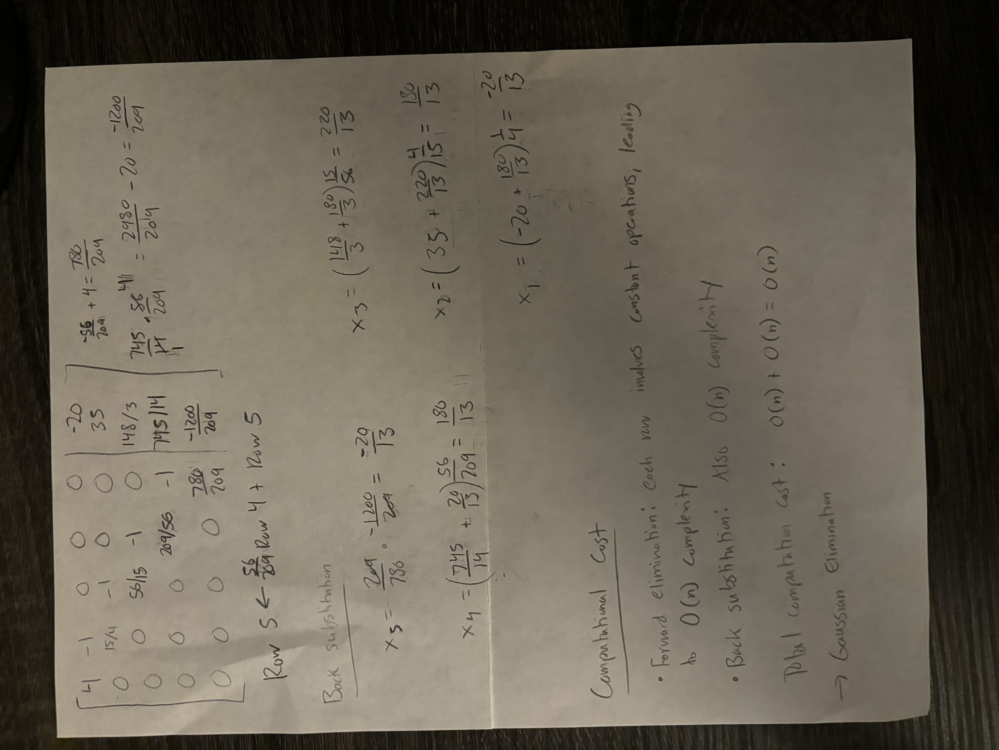

Gaussian Elimination for tridiagonal systems is highly efficient due to the sparse structure, leading to a linear complexity 𝑂(𝑛) compared to the cubic complexity 𝑂(𝑛^3) for general matrices. This efficiency makes it particularly suitable for solving large-scale tridiagonal systems.

In [ ]:
def tridiagonal_solver(n):
    # Initialize the coefficient matrix A and the right-hand side vector b
    A = [[0] * n for _ in range(n)]
    b = [0] * n

    # Fill the coefficient matrix A and the vector b
    for i in range(n):
        if i == 0:
            A[i][i] = 4
            A[i][i + 1] = -1
            b[i] = -20
        elif i == n - 1:
            A[i][i - 1] = -1
            A[i][i] = 4
            b[i] = -20
        else:
            A[i][i - 1] = -1
            A[i][i] = 4
            A[i][i + 1] = -1
            b[i] = 40

    # Forward elimination
    for k in range(n - 1):
        factor = A[k + 1][k] / A[k][k]
        A[k + 1][k] = 0
        A[k + 1][k + 1] -= factor * A[k][k + 1]
        b[k + 1] -= factor * b[k]

    # Back substitution
    x = [0] * n
    x[n - 1] = b[n - 1] / A[n - 1][n - 1]

    for k in range(n - 2, -1, -1):
        x[k] = (b[k] - A[k][k + 1] * x[k + 1]) / A[k][k]

    return x

# Solve the system for n = 100
n = 100
solution = tridiagonal_solver(n)
print("The solution vector x is:")
print(solution)

The solution vector x is:
[-1.4359353944898166, 14.256258422040734, 18.460969082652753, 19.587617908570273, 19.889502551628347, 19.970392297943118, 19.992066640144117, 19.99787426263335, 19.999430410389284, 19.99984737892379, 19.99995910530588, 19.999989042299735, 19.999997063893062, 19.999999213272517, 19.999999789197005, 19.99999994351551, 19.999999984865024, 19.999999995944595, 19.99999999891336, 19.999999999708837, 19.999999999921982, 19.999999999979096, 19.999999999994397, 19.9999999999985, 19.9999999999996, 19.999999999999893, 19.99999999999997, 19.999999999999993, 19.999999999999996, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 20.0, 19.999999999999996, 19.999999999999993, 19.99999999999997, 19.999999999999893, 19.9999999999996, 19.9999999999985, 19.999999999994397, 19.999999999979